# Проект: рынок заведений общественного питания Москвы.

<p><b>Описание проекта</b></p>

<p>Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.</p>
<p>Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.</p>
<p>Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.</p>

<p><b>Описание данных</b></p>
    
<p>Файл moscow_places.csv:</p>
<p>name — название заведения;</p>
<p>address — адрес заведения;</p>
<p>category — категория заведения, например «кафе», «пиццерия» или «кофейня»;</p>
<p>hours — информация о днях и часах работы;</p>
<p>lat — широта географической точки, в которой находится заведение;</p>
<p>lng — долгота географической точки, в которой находится заведение;</p>
<p>rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);</p>
<p>price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;</p>
<p>avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:</p>
  
<p>«Средний счёт: 1000–1500 ₽»;</p>
<p>«Цена чашки капучино: 130–220 ₽»;</p>
<p>«Цена бокала пива: 400–600 ₽».</p>
<p>и так далее;</p>
<p>middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:</p>
  
<p>Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.</p>
<p>Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.</p>
<p>Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.</p>
<p>middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:</p>
  
<p>Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.</p>
<p>Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.</p>
<p>Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.</p>
<p>chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):</p>
<p>0 — заведение не является сетевым</p>
<p>1 — заведение является сетевым</p>
<p>district — административный район, в котором находится заведение, например Центральный административный округ;</p>
<p>seats — количество посадочных мест.</p>

## Загружаем данные и изучаем общую информацию.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json
import folium
from folium import Map, Choropleth
from folium.plugins import MarkerCluster
from folium import Marker, Map
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

data = pd.read_csv('moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [2]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [3]:
print(data['name'].unique())

['WoWфли' 'Четыре комнаты' 'Хазри' ... 'Миславнес' 'Самовар' 'Kebab Time']


In [4]:
print(len(data['name'].unique())) # количество уникальных названий заведений общего питания

5614


In [5]:
data['id'] = data.index

<b>Вывод:</b> Названий завидений общего питания - 5614, каждому ресторану присваиваем id для дальнейшей работы с данными.

## Выполняем предобработку данных.

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
 14  id                 8406 non-null   int64  
dtypes: float64(6), int64(2), object(7)
memory usage: 985.2+ KB


In [7]:
data.duplicated().sum() # явные дубликаты отсутствуют, что не может не радовать

0

In [8]:
data['name'] = data['name'].str.upper()
data['name'] = data['name'].str.strip()

In [9]:
data.groupby('name').agg({'name': 'nunique','address':'nunique'}).sort_values(by='address', ascending=False).head(50)

,name,address
name,,
КАФЕ,1,189
ШОКОЛАДНИЦА,1,120
ДОМИНО'С ПИЦЦА,1,77
ДОДО ПИЦЦА,1,74
ONE PRICE COFFEE,1,72
ЯНДЕКС ЛАВКА,1,69
COFIX,1,65
PRIME,1,50
ХИНКАЛЬНАЯ,1,44


In [10]:
show_me = data.query('name == "КАФЕ"')
show_me.head(50)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,id
40,КАФЕ,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,0,NaN,40
47,КАФЕ,кафе,"Москва, улица Маршала Федоренко, 7",Северный административный округ,"ежедневно, 11:00–00:00",55.880306,37.489760,2.8,NaN,NaN,NaN,NaN,0,35.0,47
108,КАФЕ,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,0,NaN,108
123,КАФЕ,кафе,"Москва, Шенкурский проезд, 14",Северо-Восточный административный округ,NaN,55.897794,37.591395,4.3,NaN,NaN,NaN,NaN,0,50.0,123
141,КАФЕ,кафе,"Москва, Дубнинская улица, 52, стр. 1",Северный административный округ,"ежедневно, 10:00–20:00",55.896020,37.556072,3.9,NaN,NaN,NaN,NaN,0,70.0,141
159,КАФЕ,кафе,"Москва, Дмитровское шоссе, 163А",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.908830,37.538790,4.0,NaN,NaN,NaN,NaN,0,NaN,159
183,КАФЕ,кафе,"Москва, Алтуфьевское шоссе, 106",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.907607,37.588674,3.2,NaN,NaN,NaN,NaN,0,6.0,183
189,КАФЕ,кафе,"Москва, парк Ангарские Пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN,189
190,КАФЕ,кафе,"Москва, Алтуфьевское шоссе, 52А",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.878216,37.588239,4.5,NaN,NaN,NaN,NaN,0,NaN,190
209,КАФЕ,кофейня,"Москва, Алтуфьевское шоссе, 52",Северо-Восточный административный округ,пн-сб 09:00–20:00; вс 09:00–18:00,55.878024,37.587597,4.5,NaN,NaN,NaN,NaN,0,18.0,209


In [11]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,id
0,WOWФЛИ,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,0
1,ЧЕТЫРЕ КОМНАТЫ,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,1
2,ХАЗРИ,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,2
3,DORMOUSE COFFEE SHOP,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,3
4,ИЛЬ МАРКО,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,4


In [12]:
def get_street(cell):
    for addr_part in cell.split(','):
        for s_type in ['улица', 'бульвар', 'аллея', 'проспект', 'проезд', 'переулок', 'шоссе', 'набережная', 'вал', 'площадь', 'сквер', 'тупик', 'просека']:
            if s_type in addr_part: return addr_part
    return cell.split(',')[1]
data['street'] = data['address'].apply(get_street)
data['street'] = data['street'].str.strip()

In [13]:
data.head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,id,street
0,WOWФЛИ,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,0,улица Дыбенко
1,ЧЕТЫРЕ КОМНАТЫ,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,1,улица Дыбенко
2,ХАЗРИ,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,2,Клязьминская улица
3,DORMOUSE COFFEE SHOP,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,3,улица Маршала Федоренко
4,ИЛЬ МАРКО,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,4,Правобережная улица
5,SERGIO PIZZA,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,5,Ижорская улица
6,ОГНИ ГОРОДА,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,6,Клязьминская улица
7,MR. УГОЛЁК,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,7,Клязьминская улица
8,DONNA MARIA,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,8,Дмитровское шоссе
9,ГОТИКА,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,9,Ангарская улица


In [14]:
hours = data['hours'].to_list()
hours_list = []
for hour in hours:  
    if hour == 'ежедневно, круглосуточно':
        hours_list.append(True)
    else:
        hours_list.append(False)
data['is_24/7'] = hours_list
data.head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,id,street,is_24/7
0,WOWФЛИ,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,0,улица Дыбенко,False
1,ЧЕТЫРЕ КОМНАТЫ,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,1,улица Дыбенко,False
2,ХАЗРИ,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,2,Клязьминская улица,False
3,DORMOUSE COFFEE SHOP,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,3,улица Маршала Федоренко,False
4,ИЛЬ МАРКО,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,4,Правобережная улица,False
5,SERGIO PIZZA,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,5,Ижорская улица,False
6,ОГНИ ГОРОДА,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,6,Клязьминская улица,False
7,MR. УГОЛЁК,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,7,Клязьминская улица,False
8,DONNA MARIA,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,8,Дмитровское шоссе,False
9,ГОТИКА,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,9,Ангарская улица,False


<b>Вывод:</b> Явные дубликаты отсутствуют, для лучшей читаемости изменяем колонку с названиями, добавляем колонку с названием улиц, добавляем колонку с для распознания заведений которые работают или не работают круглосуточно.

## Анализ данных.

In [15]:
category = (
    data
    .groupby('category')
    .agg(count=('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
)

category['percent'] = category['count'] / sum(category['count']) * 100

category

,category,count,percent
3,кафе,2378,28.289317
6,ресторан,2043,24.304069
4,кофейня,1413,16.809422
0,"бар,паб",765,9.100642
5,пиццерия,633,7.530335
2,быстрое питание,603,7.173448
7,столовая,315,3.747323
1,булочная,256,3.045444


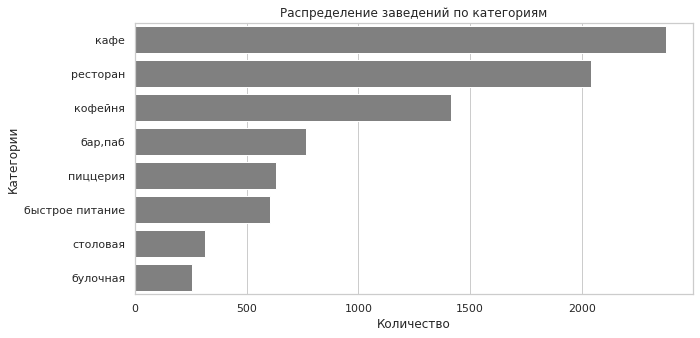

In [16]:
sns.set_theme(style="whitegrid")
plt.figure(figsize=(10, 5))
ax = sns.barplot(x='count', y='category', 
                 data=category, color = 'grey')
ax.set_title('Распределение заведений по категориям')
ax.set_xlabel('Количество') 
ax.set_ylabel('Категории')
plt.show()

<b>Вывод:</b> Кафе и ресторанов в Москве больше других заведений общественного питания.

In [17]:
category_seats = (
    data
    .groupby('category')
    .agg(seats=('seats','mean'))
    .reset_index()
    .sort_values('seats', ascending=False)
)
category_seats['percent'] = category_seats['seats'] / sum(category_seats['seats']) * 100

category_seats

,category,seats,percent
0,"бар,паб",124.532051,14.865755
6,ресторан,121.944094,14.556823
4,кофейня,111.199734,13.274237
7,столовая,99.750000,11.907449
2,быстрое питание,98.891117,11.804921
3,кафе,97.512315,11.640330
5,пиццерия,94.496487,11.280322
1,булочная,89.385135,10.670165


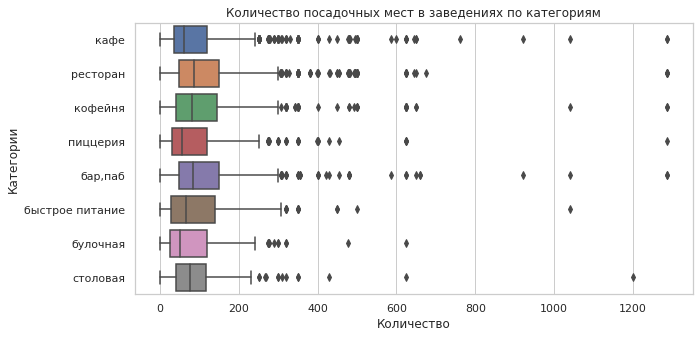

In [18]:
plt.figure(figsize=(10, 5))
ax = sns.boxplot(x='seats', y='category', 
                 data=data)
ax.set_title('Количество посадочных мест в заведениях по категориям')
ax.set_xlabel('Количество') 
ax.set_ylabel('Категории')
plt.show()

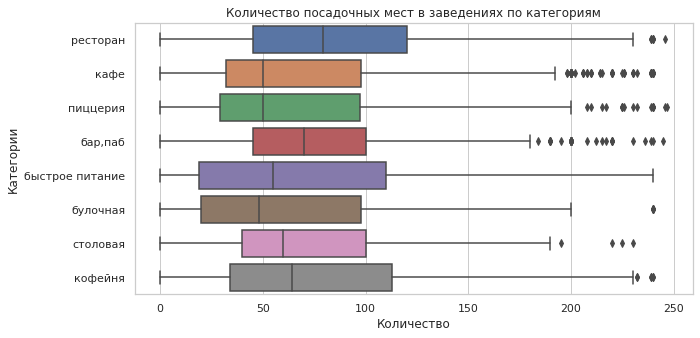

In [19]:
plt.figure(figsize=(10, 5))
ax = sns.boxplot(x='seats', y='category', 
                 data=data.query('seats < 250'))
ax.set_title('Количество посадочных мест в заведениях по категориям')
ax.set_xlabel('Количество') 
ax.set_ylabel('Категории')
plt.show()

<b>Вывод:</b> больше всего посадочных мест в пабах, ресторанах и кофейнях.

,chain,count
0,0,5201
1,1,3205


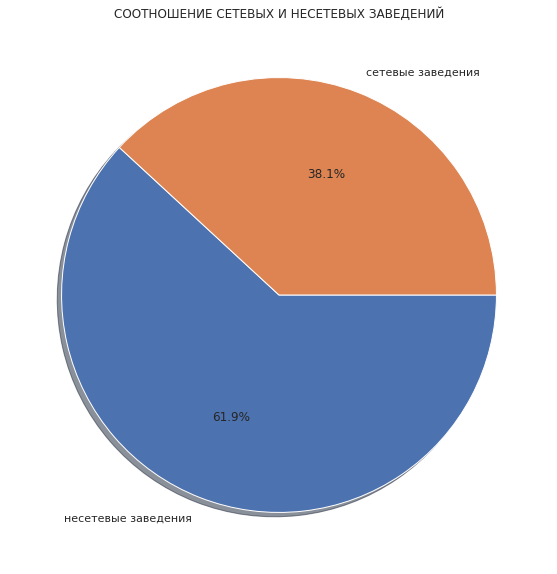

In [20]:
chain = data.groupby('chain').agg(count=('name','count')).reset_index()
display(chain)

plt.figure(figsize=(10, 10))
plt.pie(chain['count'],
        labels=chain['chain'].map({True: 'сетевые заведения', False: 'несетевые заведения'}), 
        autopct='%1.1f%%',
        counterclock=False, 
        shadow=True)
plt.title('СООТНОШЕНИЕ СЕТЕВЫХ И НЕСЕТЕВЫХ ЗАВЕДЕНИЙ')
plt.show()

<b>Вывод:</b> Несетевых заведений значительно больше.

,category,chain_count,total_count,%
1,булочная,157,256,61.328125
5,пиццерия,330,633,52.132701
4,кофейня,720,1413,50.955414
2,быстрое питание,232,603,38.474295
6,ресторан,730,2043,35.731767
3,кафе,779,2378,32.758621
7,столовая,88,315,27.936508
0,"бар,паб",169,765,22.091503


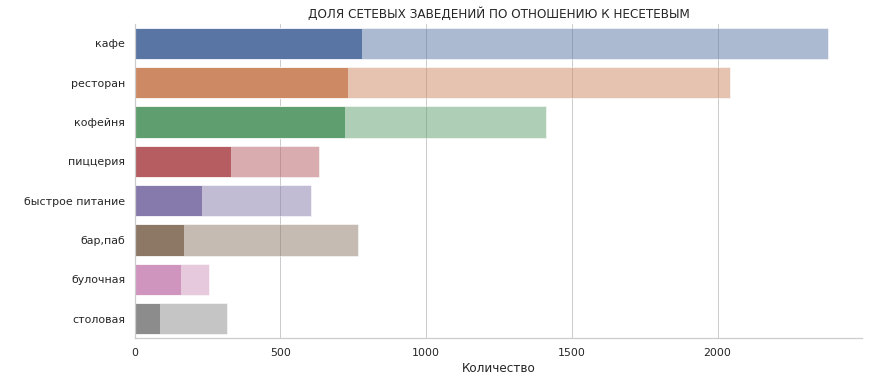

In [21]:
chain_category = data.groupby('category').agg({'chain' : 'sum',
                                'name' : 'count'}).reset_index()
chain_category.columns = ['category', 'chain_count', 'total_count']
chain_category['%'] = chain_category['chain_count'] / chain_category['total_count'] * 100
chain_category = chain_category.sort_values('chain_count', ascending=False)
display(chain_category.sort_values(by='%', ascending=False))


ax = sns.catplot(data=chain_category, 
                 kind="bar", 
                 x="chain_count", 
                 y="category",               
                 alpha=1, 
                 aspect=12/5)
ax1 = sns.barplot(x='total_count', y='category', data=chain_category, alpha=0.5,  orient='h')
ax.set_axis_labels('Количество', ' ')
plt.title('ДОЛЯ СЕТЕВЫХ ЗАВЕДЕНИЙ ПО ОТНОШЕНИЮ К НЕСЕТЕВЫМ')
plt.show()

<b>Вывод:</b> Сетевых булочных больше чем не сетевых.

In [22]:
popular_chain = data.query('chain == 1 & name != "ХИНКАЛЬНАЯ"') # отсекли данное название так как это не похоже на название сети
popular_chain_data = (
    popular_chain
    .groupby('name')
    .agg(count=('name','count'))
    .reset_index()
    .sort_values('count', ascending=False)
)
popular_chain_data['percent'] = popular_chain_data['count'] / sum(popular_chain_data['count']) * 100

popular_chain_data.head(15)


,name,count,percent
730,ШОКОЛАДНИЦА,120,3.796267
337,ДОМИНО'С ПИЦЦА,76,2.404302
333,ДОДО ПИЦЦА,74,2.341031
146,ONE PRICE COFFEE,71,2.246125
743,ЯНДЕКС ЛАВКА,69,2.182854
58,COFIX,65,2.056311
168,PRIME,50,1.581778
411,КОФЕПОРТ,42,1.328693
420,КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ,39,1.233787
630,ТЕРЕМОК,38,1.202151


In [23]:
popular_chain_data = popular_chain_data.query('percent > 0.84')
popular_chain_data = popular_chain_data.reset_index()

In [24]:
popular_chain_data

,index,name,count,percent
0,730,ШОКОЛАДНИЦА,120,3.796267
1,337,ДОМИНО'С ПИЦЦА,76,2.404302
2,333,ДОДО ПИЦЦА,74,2.341031
3,146,ONE PRICE COFFEE,71,2.246125
4,743,ЯНДЕКС ЛАВКА,69,2.182854
5,58,COFIX,65,2.056311
6,168,PRIME,50,1.581778
7,411,КОФЕПОРТ,42,1.328693
8,420,КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ,39,1.233787
9,630,ТЕРЕМОК,38,1.202151


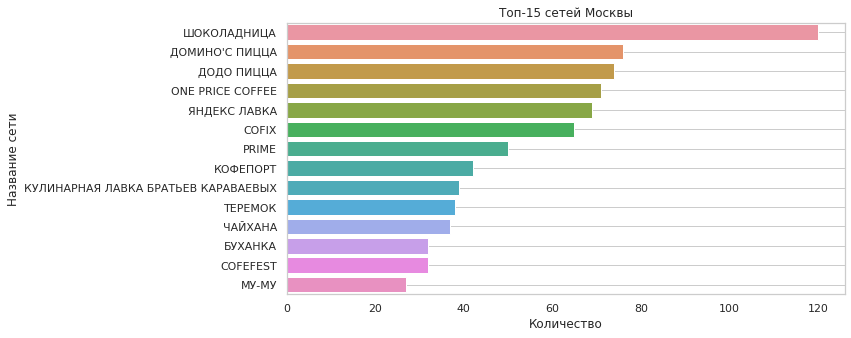

In [25]:
plt.figure(figsize=(10, 5),)
ax = sns.barplot(x='count', y='name', 
                 data=popular_chain_data)
ax.grid()
ax.set_title('Топ-15 сетей Москвы')
ax.set_xlabel('Количество') 
ax.set_ylabel('Название сети')
plt.show()

In [26]:
get_info = popular_chain_data['name'].to_list()
get_info

['ШОКОЛАДНИЦА',
 "ДОМИНО'С ПИЦЦА",
 'ДОДО ПИЦЦА',
 'ONE PRICE COFFEE',
 'ЯНДЕКС ЛАВКА',
 'COFIX',
 'PRIME',
 'КОФЕПОРТ',
 'КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ',
 'ТЕРЕМОК',
 'ЧАЙХАНА',
 'БУХАНКА',
 'COFEFEST',
 'МУ-МУ']

<b>Вывод:</b> В топе среди сетевых заведений Москвы мы видим предсказуемые: 'ШОКОЛАДНИЦА',
 "ДОМИНО'С ПИЦЦА",
 'ДОДО ПИЦЦА'.

In [27]:
#Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.
district_list = data['district'].unique()
print(district_list)

['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


In [28]:
#график с округами, количеством заведений и количеством заведений по категориям 
district_data_1 = (
    data
    .query('district == "Северный административный округ"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
district_data_1.columns = ['category','CAO']

In [29]:
district_data_2 = (
    data
    .query('district == "Северо-Восточный административный округ"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
district_data_2.columns = ['category','CBAO']

In [30]:
district_data_3 = (
    data
    .query('district == "Северо-Западный административный округ"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
district_data_3.columns = ['category','CЗАО']

In [31]:
district_data_4 = (
    data
    .query('district == "Западный административный округ"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
district_data_4.columns = ['category','ЗАО']

In [32]:
district_data_5 = (
    data
    .query('district == "Центральный административный округ"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
district_data_5.columns = ['category','ЦАО']

In [33]:
district_data_6 = (
    data
    .query('district == "Восточный административный округ"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
district_data_6.columns = ['category','ВАО']


In [34]:
district_data_7 = (
    data
    .query('district == "Юго-Восточный административный округ"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
district_data_7.columns = ['category','ЮВАО']

In [35]:
district_data_8 = (
    data
    .query('district == "Южный административный округ"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
district_data_8.columns = ['category','ЮАО']

In [36]:
district_data = (
    data
    .query('district == "Юго-Западный административный округ"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
district_data.columns = ['category','ЮЗАО']

In [37]:
district_data

,category,ЮЗАО
3,кафе,238
6,ресторан,168
4,кофейня,96
5,пиццерия,64
2,быстрое питание,61
0,"бар,паб",38
1,булочная,27
7,столовая,17


In [38]:
big_district_data = district_data.merge(district_data_1)
big_district_data = big_district_data.merge(district_data_2)
big_district_data = big_district_data.merge(district_data_3)
big_district_data = big_district_data.merge(district_data_4)
big_district_data = big_district_data.merge(district_data_5)
big_district_data = big_district_data.merge(district_data_6)
big_district_data = big_district_data.merge(district_data_7)
big_district_data = big_district_data.merge(district_data_8)

In [39]:
big_district_data

,category,ЮЗАО,CAO,CBAO,CЗАО,ЗАО,ЦАО,ВАО,ЮВАО,ЮАО
0,кафе,238,235,269,115,239,464,272,282,264
1,ресторан,168,189,182,109,218,670,160,145,202
2,кофейня,96,193,159,62,150,428,105,89,131
3,пиццерия,64,77,68,40,71,113,72,55,73
4,быстрое питание,61,58,82,30,62,87,71,67,85
5,"бар,паб",38,68,63,23,50,364,53,38,68
6,булочная,27,39,28,12,37,50,25,13,25
7,столовая,17,41,40,18,24,66,40,25,44


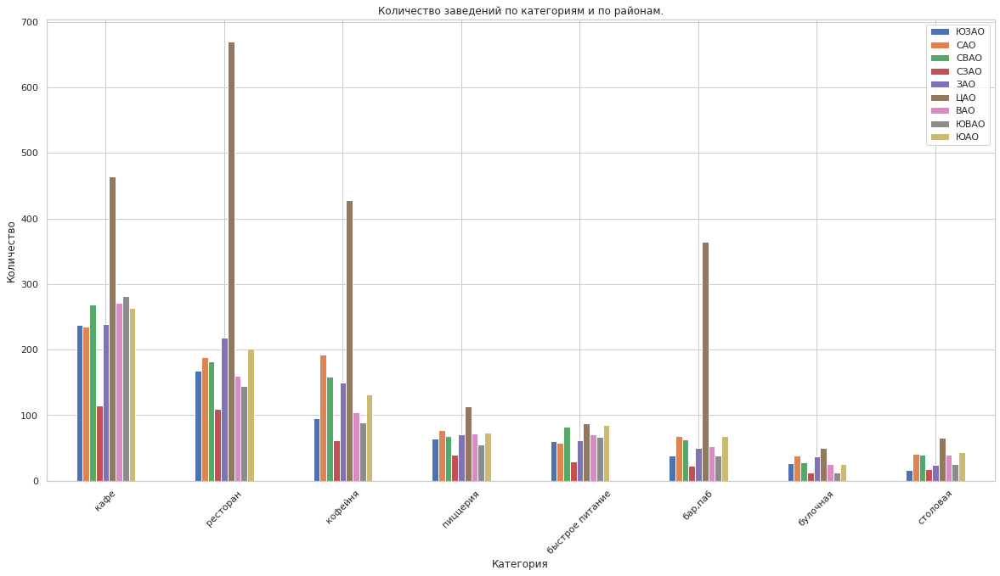

In [40]:
big_district_data.plot(x='category',kind='bar',figsize=(20,10));
plt.title('Количество заведений по категориям и по районам.')
plt.xlabel('Категория')
plt.ylabel('Количество')
plt.xticks(rotation = 45);

<b>Вывод:</b> ЦАО разительно отличается от других, так как преобладает количество ресторанов.

In [41]:
rating_data = (
    data
    .groupby('category')
    .agg(mean_rating=('rating','mean'))
    .reset_index()
    .sort_values('mean_rating', ascending=False)
)
rating_data

,category,mean_rating
0,"бар,паб",4.387712
5,пиццерия,4.301264
6,ресторан,4.290357
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.123886
2,быстрое питание,4.050249


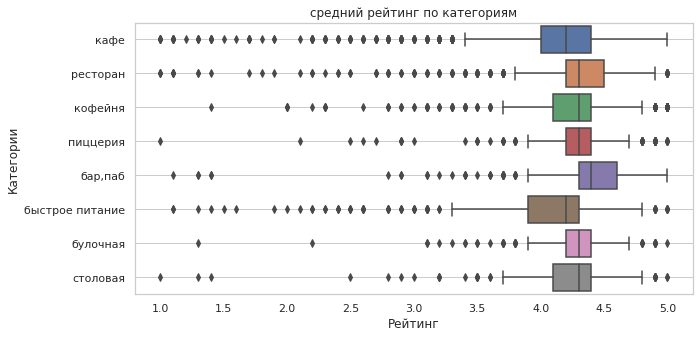

In [42]:
plt.figure(figsize=(10, 5),)
ax = sns.boxplot(x='rating', y='category', 
                 data=data)
ax.grid()
ax.set_title('средний рейтинг по категориям')
ax.set_xlabel('Рейтинг') 
ax.set_ylabel('Категории')
plt.show()

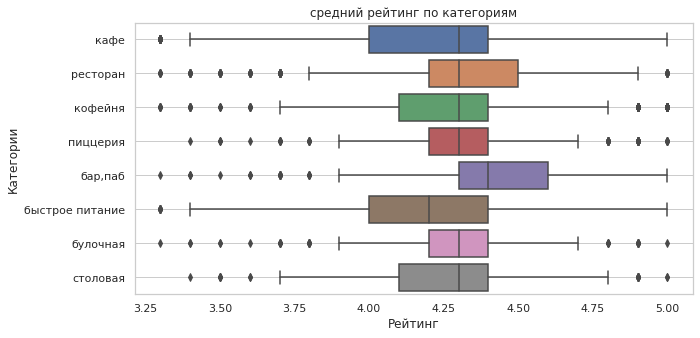

In [43]:
plt.figure(figsize=(10, 5),)
ax = sns.boxplot(x='rating', y='category', 
                 data=data.query('rating > 3.25'))
ax.grid()
ax.set_title('средний рейтинг по категориям')
ax.set_xlabel('Рейтинг') 
ax.set_ylabel('Категории')
plt.show()

<b>Вывод:</b> Лучше всего посетители оценивают бары,пабы и рестораны.

In [44]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)


In [45]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('median')
rating_df

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


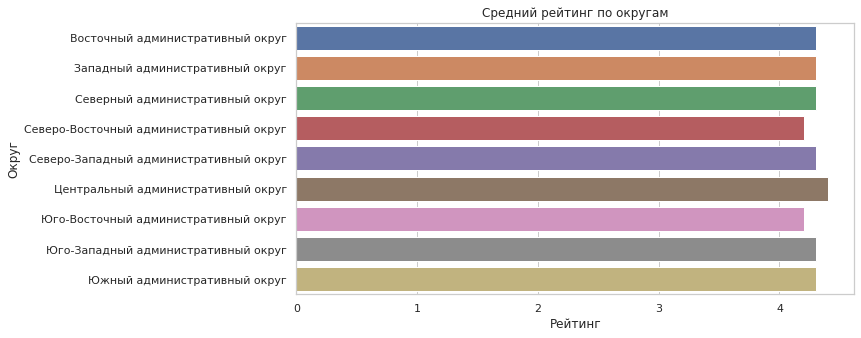

In [46]:
plt.figure(figsize=(10, 5))
ax = sns.barplot(x='rating', y='district', 
                 data= rating_df)
ax.set_title('Средний рейтинг по округам')
ax.set_xlabel('Рейтинг') 
ax.set_ylabel('Округ')
plt.show()

In [47]:
# импортируем карту и хороплет


# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
#moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

#создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

#создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

#выводим карту
m

In [48]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

<b>Вывод:</b> Заведения с самым высоким рейтингом находятся в ЦАО. Самое большое количество заведений так же в ЦАО. 

In [49]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,id,street,is_24/7
0,WOWФЛИ,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,0,улица Дыбенко,False
1,ЧЕТЫРЕ КОМНАТЫ,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,1,улица Дыбенко,False
2,ХАЗРИ,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,2,Клязьминская улица,False
3,DORMOUSE COFFEE SHOP,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,3,улица Маршала Федоренко,False
4,ИЛЬ МАРКО,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,4,Правобережная улица,False


In [50]:
data_by_street = data.groupby('street').agg(count=('id','count')).sort_values('count', ascending=False).reset_index()
data_by_street_top15 = data_by_street.head(15)
display(data_by_street_top15)

,street,count
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


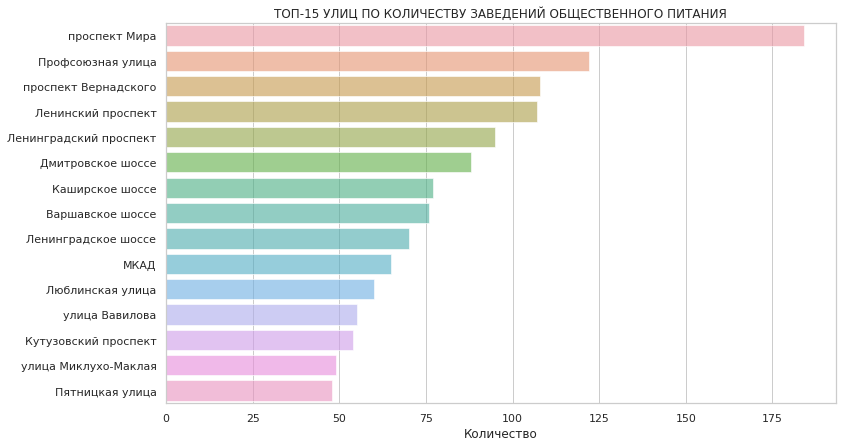

In [51]:
plt.figure(figsize=(12, 7))
ax = sns.barplot(x='count', y='street', data=data_by_street_top15, alpha=0.6, orient='h')
ax.set_title('ТОП-15 УЛИЦ ПО КОЛИЧЕСТВУ ЗАВЕДЕНИЙ ОБЩЕСТВЕННОГО ПИТАНИЯ')
ax.set_xlabel('Количество') 
ax.set_ylabel('') 
plt.show()

In [52]:
street_data_1 = (
    data
    .query('street == "проспект Мира"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
street_data_1.columns = ['category','проспект Мира']

street_data_2 = (
    data
    .query('street == "Профсоюзная улица"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
street_data_2.columns = ['category','Профсоюзная улица']

street_data_3 = (
    data
    .query('street == "проспект Вернадского"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
street_data_3.columns = ['category','проспект Вернадского']

street_data_4 = (
    data
    .query('street == "Ленинский проспект"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
street_data_4.columns = ['category','Ленинский проспект']

street_data_5 = (
    data
    .query('street == "Ленинградский проспект"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
street_data_5.columns = ['category','Ленинградский проспект']

street_data_6 = (
    data
    .query('street == "Дмитровское шоссе"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
street_data_6.columns = ['category','Дмитровское шоссе']

street_data_7 = (
    data
    .query('street == "Каширское шоссе"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
street_data_7.columns = ['category','Каширское шоссе']

street_data_8 = (
    data
    .query('street == "Варшавское шоссе"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
street_data_8.columns = ['category','Варшавское шоссе']

street_data_9 = (
    data
    .query('street == "Ленинградское шоссе"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
street_data_9.columns = ['category','Ленинградское шоссе']

street_data_10 = (
    data
    .query('street == "МКАД"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
street_data_10.columns = ['category','МКАД']

street_data_11 = (
    data
    .query('street == "Люблинская улица"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
street_data_11.columns = ['category','Люблинская улица']

street_data_12 = (
    data
    .query('street == "улица Вавилова"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
street_data_12.columns = ['category','улица Вавилова']

street_data_13 = (
    data
    .query('street == "Кутузовский проспект"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
street_data_13.columns = ['category','Кутузовский проспект']

street_data_14 = (
    data
    .query('street == "улица Миклухо-Маклая"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
street_data_14.columns = ['category','улица Миклухо-Маклая']

street_data_15 = (
    data
    .query('street == "Пятницкая улица"')
    .groupby('category')
    .agg(count = ('id','count'))
    .reset_index()
    .sort_values('count', ascending=False)
                )
street_data_15.columns = ['category','Пятницкая улица']

In [53]:
big_street_data = street_data_1.merge(street_data_2)
big_street_data = big_street_data.merge(street_data_3)
big_street_data = big_street_data.merge(street_data_4)
big_street_data = big_street_data.merge(street_data_5)
big_street_data = big_street_data.merge(street_data_6)
big_street_data = big_street_data.merge(street_data_7)
big_street_data = big_street_data.merge(street_data_8)
big_street_data = big_street_data.merge(street_data_9)
big_street_data = big_street_data.merge(street_data_10)
big_street_data = big_street_data.merge(street_data_11)
big_street_data = big_street_data.merge(street_data_12)
big_street_data = big_street_data.merge(street_data_13)
big_street_data = big_street_data.merge(street_data_14)
big_street_data = big_street_data.merge(street_data_15)

In [54]:
big_street_data

,category,проспект Мира,Профсоюзная улица,проспект Вернадского,Ленинский проспект,Ленинградский проспект,Дмитровское шоссе,Каширское шоссе,Варшавское шоссе,Ленинградское шоссе,МКАД,Люблинская улица,улица Вавилова,Кутузовский проспект,улица Миклухо-Маклая,Пятницкая улица
0,кафе,53,35,25,26,12,23,20,18,13,45,26,15,14,21,7
1,ресторан,45,26,33,33,25,24,19,20,26,5,10,12,16,15,18
2,кофейня,36,18,16,23,25,11,16,14,13,4,11,10,13,4,6
3,быстрое питание,21,15,12,2,2,10,10,7,5,9,5,11,2,4,2
4,"бар,паб",12,6,7,10,15,6,2,6,5,1,5,2,2,3,9


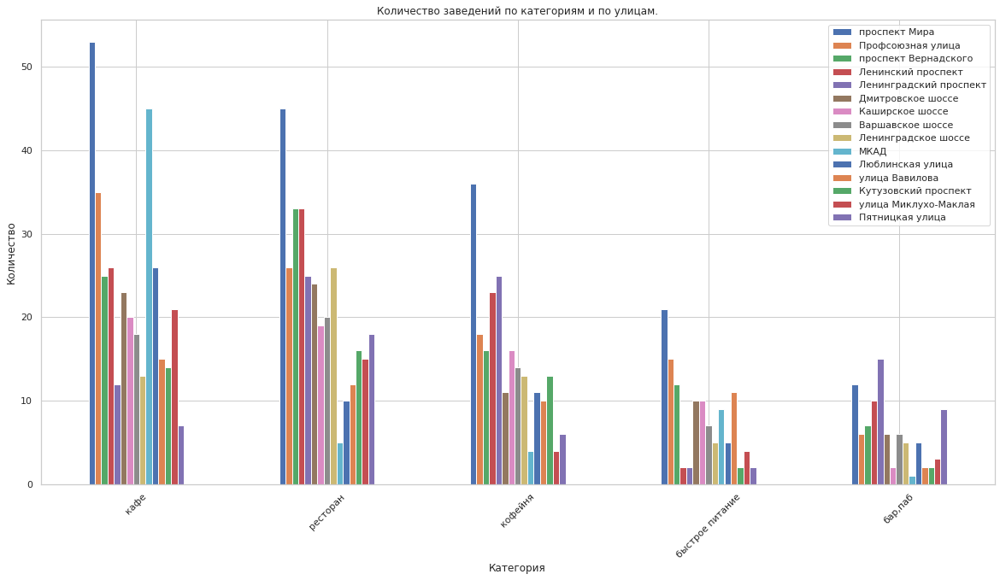

In [55]:
big_street_data.plot(x='category',kind='bar',figsize=(20,10));
plt.title('Количество заведений по категориям и по улицам.')
plt.xlabel('Категория')
plt.ylabel('Количество')
plt.xticks(rotation = 45);

<b>Вывод:</b> Больше всего заведений общественного питания находятся на проспекте Мира, с большим отрывом.

In [56]:
data_1_restrant = data_by_street.query('count ==1')

In [57]:
data_1_restrant

,street,count
994,улица Советской Армии,1
995,улица Полины Осипенко,1
996,улица Годовикова,1
997,улица Высоцкого,1
998,улица Вучетича,1
...,...,...
1454,Павелецкая набережная,1
1455,Панкратьевский переулок,1
1456,Парусный проезд,1
1457,Певческий переулок,1


<b>Вывод:</b> количество улиц с одним заведением общественного питания - 465.

In [58]:
data_median = data.groupby('district').agg(median=('middle_avg_bill','median')).reset_index()
data_median

,district,median
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


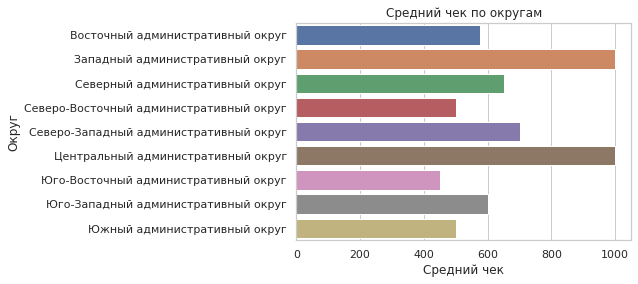

In [59]:
ax = sns.barplot(x='median', y='district', data=data_median)
ax.set_title('Средний чек по округам')
ax.set_xlabel('Средний чек') 
ax.set_ylabel('Округ') 
plt.show()

In [60]:
m_new = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=data_median,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Ценовой индекатор районов',
).add_to(m_new)

#выводим карту
m_new

<b>Вывод:</b> Заведения с самым высоким средним чеком находятся в ЦАО и ЗАО.

<b>Промежуточный вывод:</b> Больше всего заведений в ЦАО, так же ЦАО отличается от других районов значительным количеством ресторанов по отношению к остальным категориям заведений. Самые высокие рейтинги у баров и пабов, на втором месте рестораны. На первом месте по количеству завдений находится проспект мира. Так же в датасете присутствуют улицы на которых располагается только один объект общественного питания. Самые высокие средние чеки у ЦАО и ЗАО. ЗАО отличается высокими ценами не смотря на низкие рейтинги, можно сказать что конкурировать легче всего будет именно в этом округе.

## Детализируем исследование: открытие кофейни.

In [61]:
data_coffe = data.query('category == "кофейня"')
data_coffe.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413 entries, 3 to 8400
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1413 non-null   object 
 1   category           1413 non-null   object 
 2   address            1413 non-null   object 
 3   district           1413 non-null   object 
 4   hours              1398 non-null   object 
 5   lat                1413 non-null   float64
 6   lng                1413 non-null   float64
 7   rating             1413 non-null   float64
 8   price              476 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1413 non-null   int64  
 13  seats              751 non-null    float64
 14  id                 1413 non-null   int64  
 15  street             1413 non-null   object 
 16  is_24/7            1413 

In [62]:
coffe_district_count = data_coffe.groupby('district').agg(count = ('id','count'))
coffe_district_count

,count
district,
Восточный административный округ,105
Западный административный округ,150
Северный административный округ,193
Северо-Восточный административный округ,159
Северо-Западный административный округ,62
Центральный административный округ,428
Юго-Восточный административный округ,89
Юго-Западный административный округ,96
Южный административный округ,131


In [63]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_coffe.apply(create_clusters, axis=1)

# выводим карту
m

In [64]:
data_coffe['is_24/7'].sum() # количество кофеен работающих круглосуточно

59

In [65]:
rating_coffe = data_coffe.groupby('district', as_index=False)['rating'].agg('median')

m_coffe = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=rating_coffe,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Рейтинг кофейн по районам',
).add_to(m_coffe)

#выводим карту
m_coffe

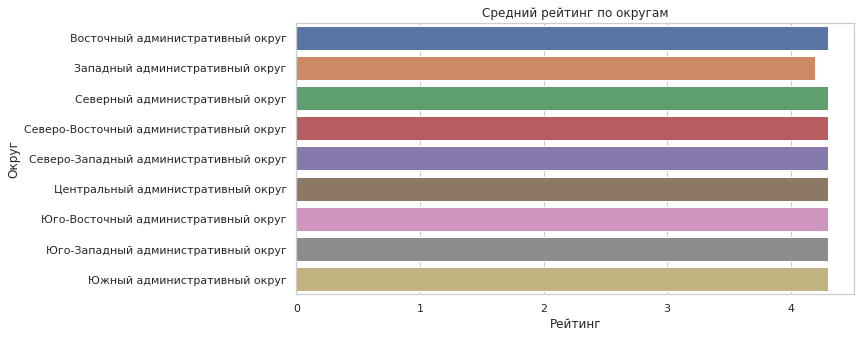

In [66]:
plt.figure(figsize=(10, 5))
ax = sns.barplot(x='rating', y='district', 
                 data= rating_coffe)
ax.set_title('Средний рейтинг по округам')
ax.set_xlabel('Рейтинг') 
ax.set_ylabel('Округ')
plt.show()

In [67]:
price_coffe = data_coffe.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')

m_coffe_price = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=price_coffe,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Цена чашки капучино по районам',
).add_to(m_coffe_price)

#выводим карту
m_coffe_price

In [68]:
price_coffe

,district,middle_coffee_cup
0,Восточный административный округ,135.0
1,Западный административный округ,189.0
2,Северный административный округ,159.0
3,Северо-Восточный административный округ,162.5
4,Северо-Западный административный округ,165.0
5,Центральный административный округ,190.0
6,Юго-Восточный административный округ,147.5
7,Юго-Западный административный округ,198.0
8,Южный административный округ,150.0


<b>Вывод:</b> Всего кофеен в исследовании 1413,больше всего кофеен в центральном округе - 428. Есть круглосуточные кофейни, их 59. Средние рейтинги кафе 4.20 - 4.30, самые низкие в ЗАО. Средняя стоимость чашки от 135 до 198, стоит ориентироваться на эти числа при открытии кофейни. Рекомендую открыть кофейню в ЗАО так как там самые низкие рейтинги кафейнь а так же высокая средняя стоимость за чашку, будет проще конкурировать, так же по количеству кофейнь ЗАО находится на четвертом месте.

<h1><b>Общий вывод:</b><h1>

Всего в проекте представлено 8406 заведений общего питания Москвы. В данных представлены разные категории заведений, а именно: кофейни, кафе, рестораны. бары и пабы, столовые, пиццерии, булочные, заведения быстрого питания. Больше всего предсталвено кафе, рестораны на втором месте а на третьем кофейни по количеству. По количеству посадочных мест лидируют рестораны затем бары и пабы. Сетевых заведений общественного питания меньше несетевых почти в два раза. Чаще всего сетевыми являются булочные. На первом месте среди самых популярных заведений располагается Шоколадница. В датасете присутствуют все административные районы Москвы, такие как : Восточный административный округ, Западный административный округ, Северный административный округ, Северо-Восточный административный округ, Северо-Западный административный округ, Центральный административный округ, Юго-Восточный административный округ, Юго-Западный административный округ, Южный административный округ. Больше всего заведений в ЦАО, так же ЦАО отличается от других районов значительным количеством ресторанов по отношению к остальным категориям заведений. Самые высокие рейтинги у баров и пабов, на втором месте рестораны. На первом месте по количеству завдений находится проспект мира. Так же в датасете присутствуют улицы на которых располагается только один объект общественного питания. Самые высокие средние чеки у ЦАО и ЗАО.